## Code

In [1]:
import numpy as np
import matplotlib.pyplot as plt
from skimage.io import imread
from skimage.color import rgb2gray
import matplotlib
from skimage.exposure import rescale_intensity
from skimage.transform import resize
from skimage import img_as_float, img_as_ubyte
import os

In [2]:
def kmean_sample(imgs, clusters):
    
    from sklearn.cluster import KMeans
    # Create RGBXY image
    
    mid = imgs.shape[0] // 2
    
    underexposed_1 = imgs[mid]
    
    row_size, col_size = imgs[mid].shape[0], imgs[mid].shape[1]
    
    underexposed_1xy = np.zeros((row_size, col_size, 5), dtype=int)
    for p in range(row_size):
        for q in range(col_size):
            underexposed_1xy[p][q] = [underexposed_1[p][q][0], \
                                underexposed_1[p][q][1], \
                                underexposed_1[p][q][2],p,q]
    underexposed_1xy = np.reshape(underexposed_1xy,(row_size*col_size, 5))
    kmeans = KMeans(n_clusters=clusters, max_iter = 4, random_state=0).fit(underexposed_1xy)

    samples = []
    
    label = kmeans.labels_
    
    for i in range(clusters):
        samplePos = np.argwhere(label == i)
        label_pos = np.resize(samplePos, samplePos.shape[0])
        if (label_pos.shape[0] != 0):
            pos = np.random.choice(label_pos, 1)
            samples.append([pos//col_size, pos%col_size])
    return np.asarray(samples)

In [3]:
def loadv2(path):
    images = []
    times = []
    with open(os.path.join(path, 'input.txt')) as f:
        filenames = []
        for line in f:
            if (line[0] == '#'):
                continue
            (filename, exposure, *rest) = line.split()
            filenames += [filename]
            times += [exposure]
    
        images = np.array([imread(os.path.join(path, file)) for file in filenames])
        times = np.array(times, dtype=np.float32)

    return images, times

In [4]:
def load(filenames, times):
    
    # List of exposure times
    times = np.array(times, dtype=np.float32)
    
    # list of imgs
    images = np.array([imread(filename) for filename in filenames])

    return images, times


In [5]:
from skimage.feature import (corner_harris, corner_peaks, plot_matches, BRIEF, match_descriptors) 
from skimage.transform import warp, ProjectiveTransform, SimilarityTransform
from skimage.measure import ransac

# homography based image alignment
def align(imgs, times, threshold=15):
    align_imgs = []
    align_times = []
    
    # set the mid image as world coordinate
    mid = imgs.shape[0] // 2
    imL = imgs[mid]
    imLgray = rgb2gray(imL)
    
    for i in range(0, imgs.shape[0]):
        print('Doing image alignment {0}/{1}.... '.format(i+1, imgs.shape[0]), end='')
        if i == mid:
            imL_ = img_as_ubyte(imL)
            align_imgs.append(imL_)
            align_times.append(times[mid])
            print('done')
            continue
        imR = imgs[i]
        imRgray = rgb2gray(imR)
        
        keypointsL = corner_peaks(corner_harris(imLgray), threshold_rel=0.0005, min_distance=5) 
        keypointsR = corner_peaks(corner_harris(imRgray), threshold_rel=0.0005, min_distance=5)
        
        extractor = BRIEF()
        
        extractor.extract(imLgray, keypointsL) 
        keypointsL = keypointsL[extractor.mask] 
        descriptorsL = extractor.descriptors
        
        extractor.extract(imRgray, keypointsR) 
        keypointsR = keypointsR[extractor.mask] 
        descriptorsR = extractor.descriptors
        
        matchesLR = match_descriptors(descriptorsL, descriptorsR, cross_check=True)
        
        src = np.array([keypointsR[i][::-1] for i in matchesLR[:,1]]) # to swap x,y 
        des = np.array([keypointsL[i][::-1] for i in matchesLR[:,0]]) # to swap x,y
        
        # dark image is hard to find matches, to avoid bad seed
        count = 0
        max_iter = 0
        
        # throw the image, as it doesn't provide good matching
        while(count <= threshold):
            if max_iter > 20:
                break
            model_robust1, inliers1 = ransac((src, des), ProjectiveTransform, \
                                         min_samples=4, residual_threshold=4, max_trials = 1000)
            # debug
            count = len(list(filter(lambda x: x, inliers1)))
            max_iter+=1
            
        if max_iter > 20:
            print('failed')
            continue    
        
        matchesLR_ransac = np.array([matchesLR[i] for i in range(len(matchesLR)) if inliers1[i] == True])
        
        r, c = imR.shape[:2]
        
        corners = np.array([[0, 0], [0, r], [c, 0], [c, r]])
        
        warped_corners = model_robust1(corners)
        
        all_corners = np.vstack((warped_corners, corners))
        
        corner_min = np.array([0, 0])
        corner_max = np.array([imL.shape[1], imL.shape[0]])
        
        output_shape = (corner_max - corner_min) 
        output_shape = np.ceil(output_shape[::-1])
        
        offset = SimilarityTransform(translation=-corner_min)
        
        imL_ = warp(imL, offset.inverse, output_shape=output_shape, cval=-1)
        imR_ = warp(imR, (model_robust1 + offset).inverse, output_shape=output_shape, cval=-1)
        
        # rescale back to [0, 255] int
        imR_ = img_as_ubyte(imR_)
        align_imgs.append(imR_)
        align_times.append(times[i])
        
        print('done')
        
    
    return np.array(align_imgs), times

In [6]:
def Debevec_Malik(imgs, times, l, sample_idx=None):
    '''
    l: constant of smooth
    
    sample_idx: None or array of sample_idx, can use kmean for sampling,
    produce better response function but slower
    if None: use resize
    
    warpper for gsolve, return 
    1) g(Z) = ln Ei + ln tj (256 values)
    2) Ln Ei
    '''
    B = [np.log(e) for e in times]
    w = [z if z <= 0.5*255 else 255-z for z in range(256)]

    if sample_idx is None:
        sample_img = [img_as_ubyte(resize(img, (10, 10))) for img in imgs]
    else:
        sample_img = [img_as_ubyte(img[sample_idx[:, 0], sample_idx[:, 1]]) for img in imgs]
    
    Z = [img.flatten() for img in sample_img]
    
    return gsolve(Z, B, l, w)

In [7]:
def gsolve(Z,B,l,w):
    '''
    gsolve from paper
    solve for system's response function g
    and irradiance values for observed pixels
    '''
    n = 256
    
    A = np.zeros(shape=(np.size(Z, 0)*np.size(Z, 1)+n+1, n+np.size(Z, 1)), dtype=np.float32)
    b = np.zeros(shape=(np.size(A, 0), 1), dtype=np.float32)
    
    # Include the data−fitting equations
    
    k = 0
    for i in range(np.size(Z, 1)):
        for j in range(np.size(Z, 0)):
            z = Z[j][i]
            wij = w[z]
            A[k][z] = wij
            A[k][n+i] = -wij
            b[k] = wij*B[j]
            k += 1
    # Fix the curve by setting its middle value to 0
    
    A[k][128] = 1
    k += 1
    
    for i in range(n-1):
        A[k][i] = l*w[i+1]
        A[k][i+1] = -2*l*w[i+1]
        A[k][i+2] = l*w[i+1]
        k += 1
    
    inv_A = np.linalg.pinv(A)
    x = np.dot(inv_A, b)
    #x = np.linalg.lstsq(A, b)[0]
    g = x[:256]
    lE = x[256:]

    return g, lE

In [8]:
def radiance_map(g, Z, ln_t, w):
    '''
    equation (6) from paper
    use response function g and pixel value Z, expose time ln_t
    '''
    temp_a = np.zeros(len(Z[0]))
    ln_E = np.zeros(len(Z[0]))
    
    pixels, imgs = len(Z[0]), len(Z)
    for i in range(pixels):
        temp_b = 0
        for j in range(imgs):
            z = Z[j][i]
            temp_a[i] += w[z]*(g[z] - ln_t[j])
            temp_b += w[z]
        ln_E[i] = temp_a[i]/temp_b if temp_b > 0 else temp_a[i]
    
    return ln_E

In [9]:
def construct_hdr(imgs, times, l, align_bool=False, sample_method='resize', cluster=20):
    
    if align_bool:
        imgs, times = align(imgs, times)
    
    num_channels = imgs[0].shape[2]
    hdr_image = np.zeros(imgs[0].shape, dtype=np.float64)
    
    if sample_method != 'resize':
        sample_idx = kmean_sample(imgs, cluster)

    for channel in range(num_channels):
        print('Constructing radiance map for {0} channel .... '.format('RGB'[channel]), end='')
        # Collect the current layer of each input image from the exposure stack
        layer_stack = [img[:, :, channel] for img in imgs]
        Z = [img.flatten().tolist() for img in layer_stack]
        
        # Compute Response Curve
        if sample_method == 'resize':
            g, _ = Debevec_Malik(layer_stack, times, l, None)
        else:
            g, _ = Debevec_Malik(layer_stack, times, l, sample_idx)
        
        B = [np.log(e) for e in times]
        w = [z if z <= 0.5*255 else 255-z for z in range(256)]
        

        # Build radiance map
        img_rad_map = radiance_map(g, Z, B, w)

        # Normalize hdr layer to (0, 255)
        hdr_image[..., channel] = np.reshape(img_rad_map, (imgs[0].shape[0], imgs[0].shape[1]))
        print('done')
    
    return hdr_image

In [10]:
# use for tone mapping
def sigmoid(x):
    return 1./(1.+np.exp(-x))

# or use adjust_sigmoid, which gives extra parameter gain and cutoff
from skimage.exposure import adjust_sigmoid

In [11]:
# equalize_adapthist tone mapping
from skimage.exposure import equalize_adapthist

## Testing 

### Test 1: alignment effect

#### Before Alignment

In [12]:
imgs, times = load(["img_0.033.jpg", "img_0.25.jpg", "img_2.5.jpg", "img_15.jpg"]\
                   , [ 1/30.0, 0.25, 2.5, 15.0])

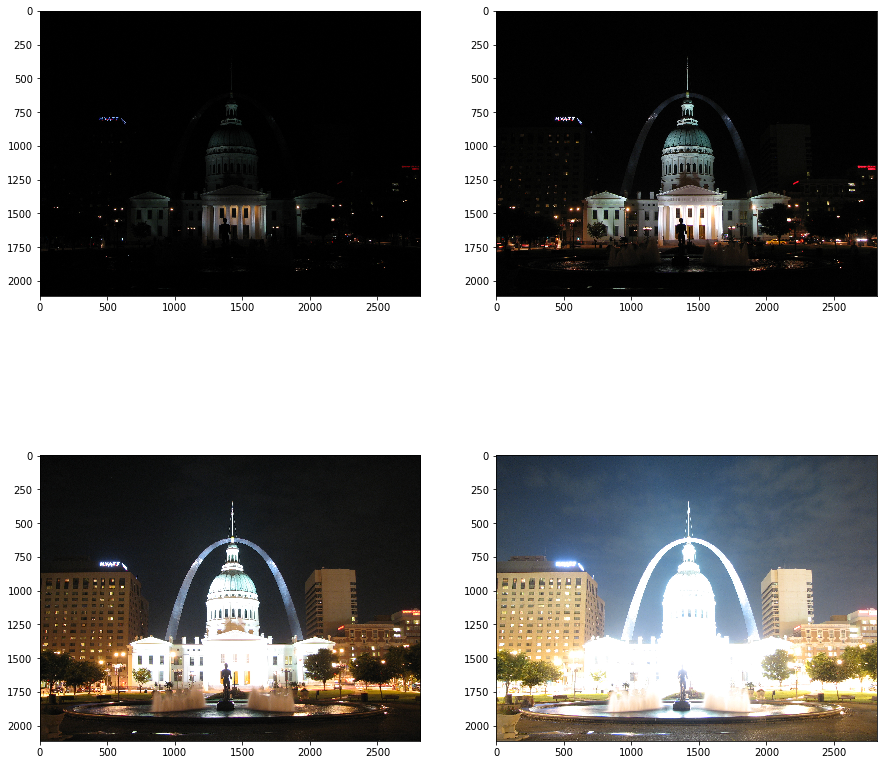

In [13]:
# show all images
plt.figure(figsize=(15,15))
plt.subplot(2,2,1)
plt.imshow(imgs[0])
plt.subplot(2,2,2)
plt.imshow(imgs[1])
plt.subplot(2,2,3)
plt.imshow(imgs[2])
plt.subplot(2,2,4)
plt.imshow(imgs[3])
plt.show()

/Users/Hanzhen/anaconda3/lib/python3.6/site-packages/skimage/transform/_warps.py:105: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "
/Users/Hanzhen/anaconda3/lib/python3.6/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/Users/Hanzhen/anaconda3/lib/python3.6/site-packages/skimage/util/dtype.py:130: UserWarning: Possible precision loss when converting from float64 to uint8
  .format(dtypeobj_in, dtypeobj_out))


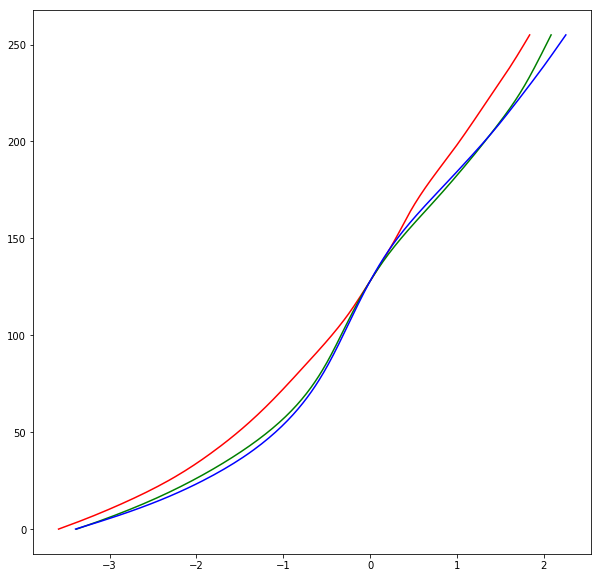

In [14]:
# check the response curve in each channel, you might tune the constant l to get better result
plt.figure(figsize=(10,10))
r = imgs[:,:,:,0]
g = imgs[:,:,:,1]
b = imgs[:,:,:,2]
gr, _ = Debevec_Malik(r, times, 200)
gg, _ = Debevec_Malik(g, times, 200)
gb, _ = Debevec_Malik(b, times, 200)
plt.plot(gr, range(256), 'r')
plt.plot(gg, range(256), 'g')
plt.plot(gb, range(256), 'b')
plt.show()

In [15]:
# constructing hdr radiance map
hdr1 = construct_hdr(imgs, times, 200.)

Constructing radiance map for R channel .... done
Constructing radiance map for G channel .... done
Constructing radiance map for B channel .... done


In [16]:
print(np.max(hdr1))
print(np.min(hdr1))

5.6393232345581055
-5.675252278645833


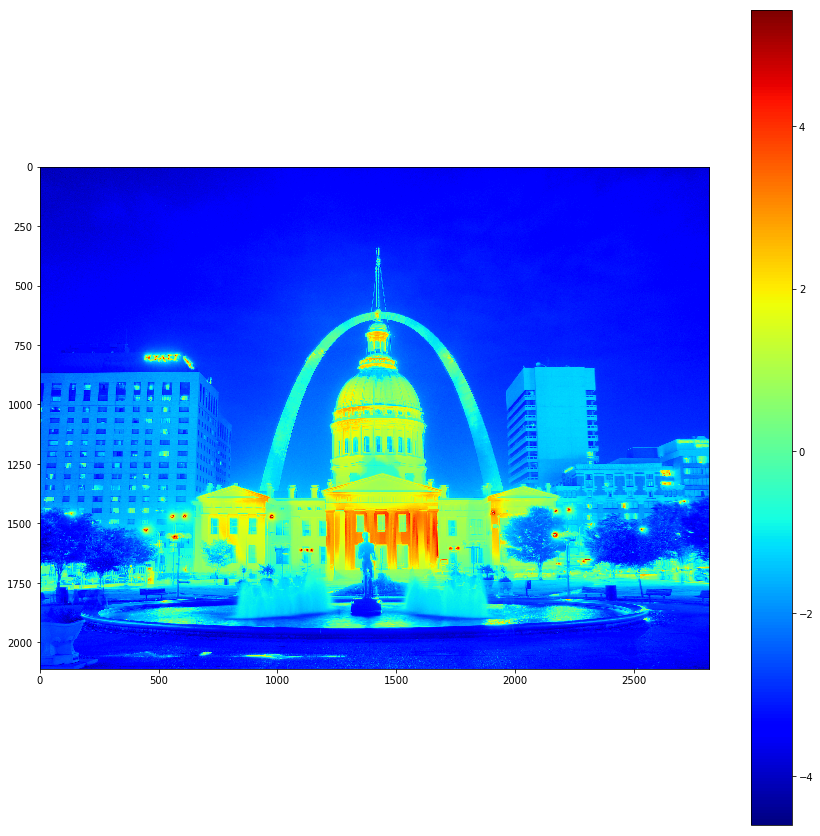

In [17]:
# visulize the radiance map
plt.figure(figsize=(15,15))
plt.imshow(rgb2gray(hdr1), cmap='jet')
plt.colorbar()
plt.show()
#matplotlib.image.imsave('hdr_rmap.png', rgb2gray(hdr1), cmap='jet')

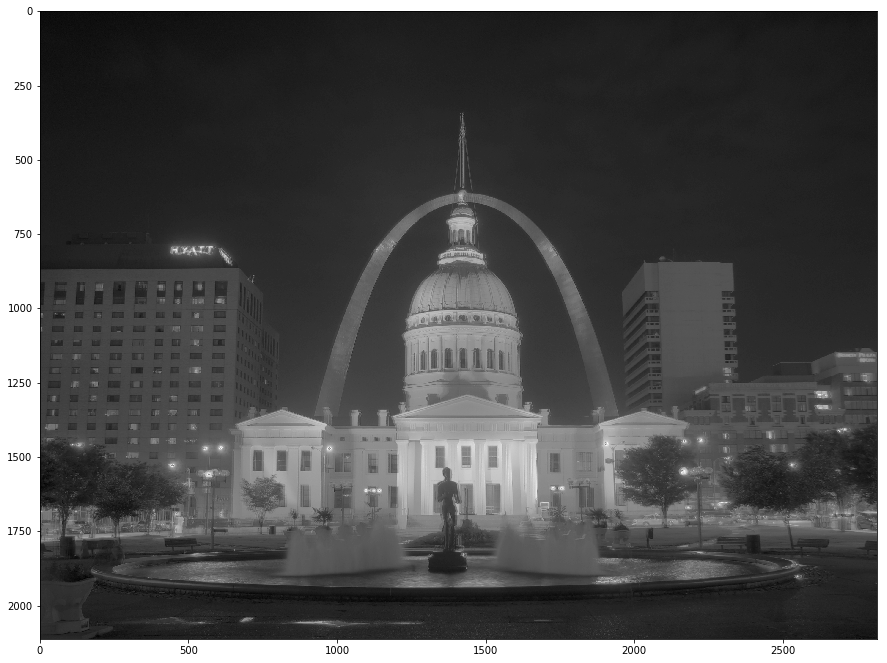

In [18]:
# visulize the hdr image by grayscale tone mapping
plt.figure(figsize=(15,15))
plt.imshow(rgb2gray(hdr1), cmap='gray')
plt.show()
#matplotlib.image.imsave('hdr_gray.png', rgb2gray(hdr1), cmap='gray')

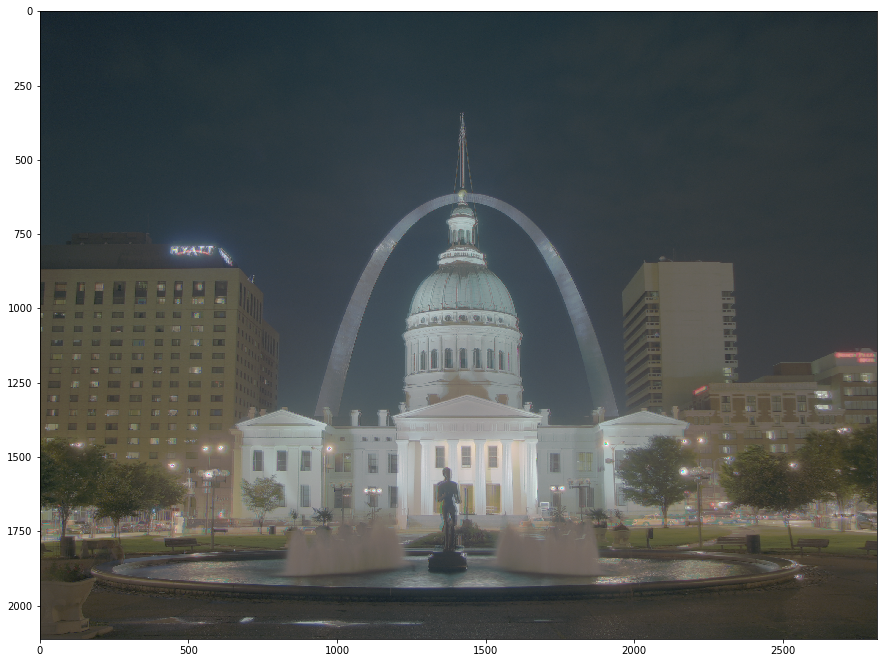

In [19]:
# visulize the hdr image by normalized tone mapping
plt.figure(figsize=(15,15))
hdr1_normalized = rescale_intensity(hdr1, out_range=(0., 1.))
plt.imshow(hdr1_normalized)
plt.show()
#matplotlib.image.imsave('hdr_normalize.png', hdr1_normalized)

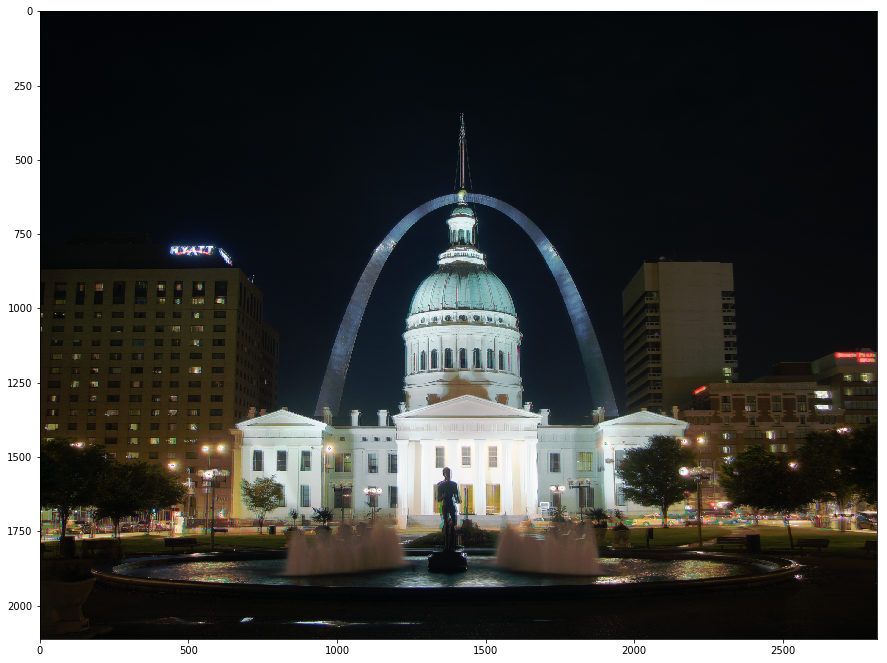

In [20]:
# visulize the hdr image by sigmoid tone mapping
plt.figure(figsize=(15,15))
hdr_sigmoid = np.array(list(map(sigmoid, hdr1)))
plt.imshow(hdr_sigmoid)
plt.show()
#matplotlib.image.imsave('hdr_sigmoid.png', hdr_sigmoid)

/Users/Hanzhen/anaconda3/lib/python3.6/site-packages/skimage/color/colorconv.py:275: RuntimeWarning: divide by zero encountered in true_divide
  out[idx, 0] = (arr[idx, 1] - arr[idx, 2]) / delta[idx]
/Users/Hanzhen/anaconda3/lib/python3.6/site-packages/skimage/color/colorconv.py:279: RuntimeWarning: divide by zero encountered in true_divide
  out[idx, 0] = 2. + (arr[idx, 2] - arr[idx, 0]) / delta[idx]
/Users/Hanzhen/anaconda3/lib/python3.6/site-packages/skimage/util/dtype.py:130: UserWarning: Possible precision loss when converting from float64 to uint16
  .format(dtypeobj_in, dtypeobj_out))


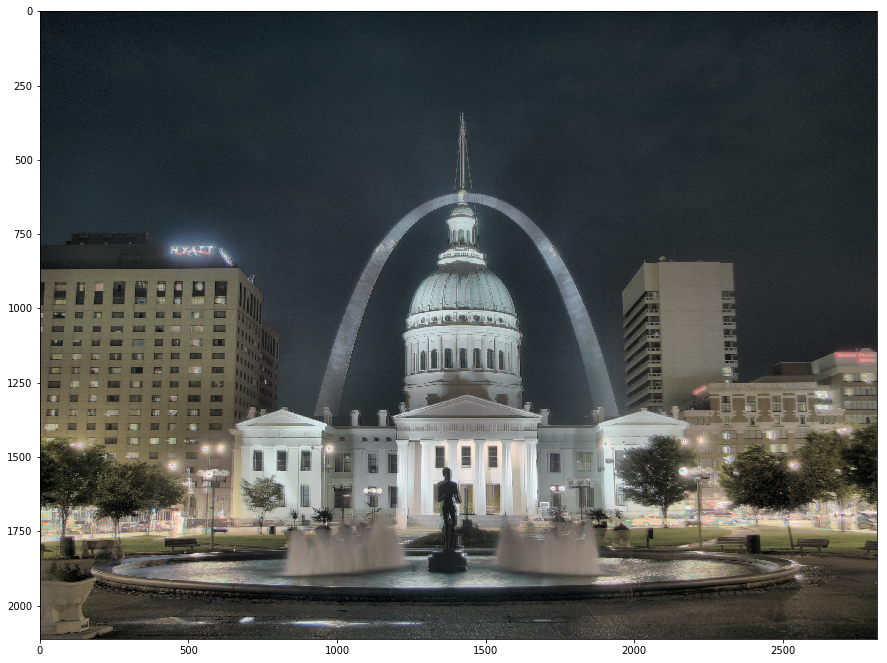

In [21]:
# visulize the hdr image by equalize_adapthist tone mapping (through normalized)
plt.figure(figsize=(15,15))
hdr1_hist = equalize_adapthist(hdr1_normalized)
plt.imshow(hdr1_hist)
plt.show()

Clipping input data to the valid range for imshow with RGB data ([0..1] for floats or [0..255] for integers).


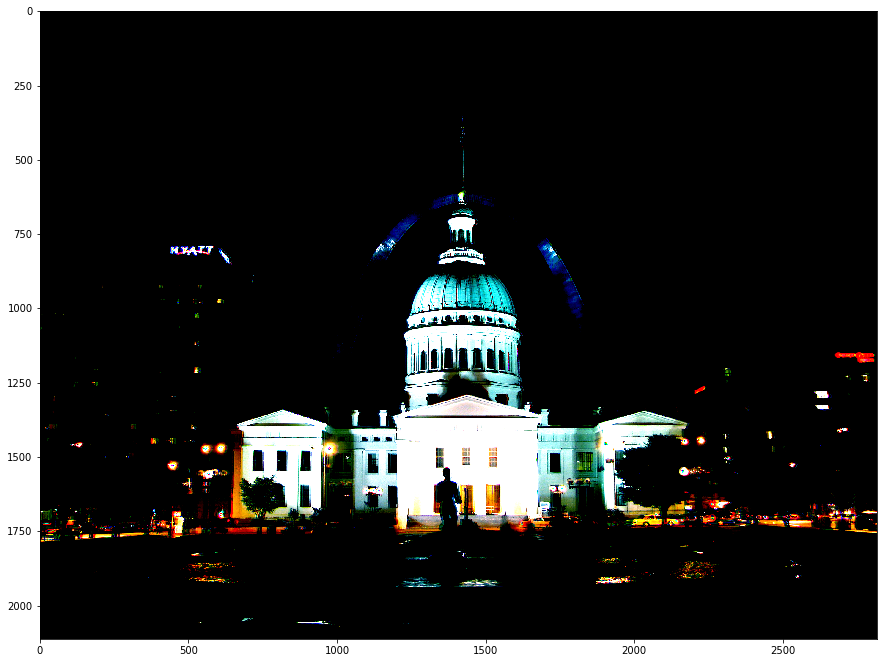

In [22]:
# no tone mapping
plt.figure(figsize=(15,15))
plt.imshow(hdr1)
plt.show()

#### After alignment

Now we add homograph based alignment to get rid of the shaking artifact, especially useful in images taken with out a tripod.

In [23]:
# constructing hdr radiance map
hdr1_align = construct_hdr(imgs, times, 200., True)

Doing image alignment 1/4.... 

/Users/Hanzhen/anaconda3/lib/python3.6/site-packages/skimage/transform/_geometric.py:554: RuntimeWarning: invalid value encountered in true_divide
  dst[:, 0] /= dst[:, 2]
/Users/Hanzhen/anaconda3/lib/python3.6/site-packages/skimage/transform/_geometric.py:555: RuntimeWarning: invalid value encountered in true_divide
  dst[:, 1] /= dst[:, 2]
/Users/Hanzhen/anaconda3/lib/python3.6/site-packages/skimage/measure/fit.py:831: RuntimeWarning: invalid value encountered in less
  sample_model_inliers = sample_model_residuals < residual_threshold


done
Doing image alignment 2/4.... done
Doing image alignment 3/4.... done
Doing image alignment 4/4.... done
Constructing radiance map for R channel .... done
Constructing radiance map for G channel .... done
Constructing radiance map for B channel .... done


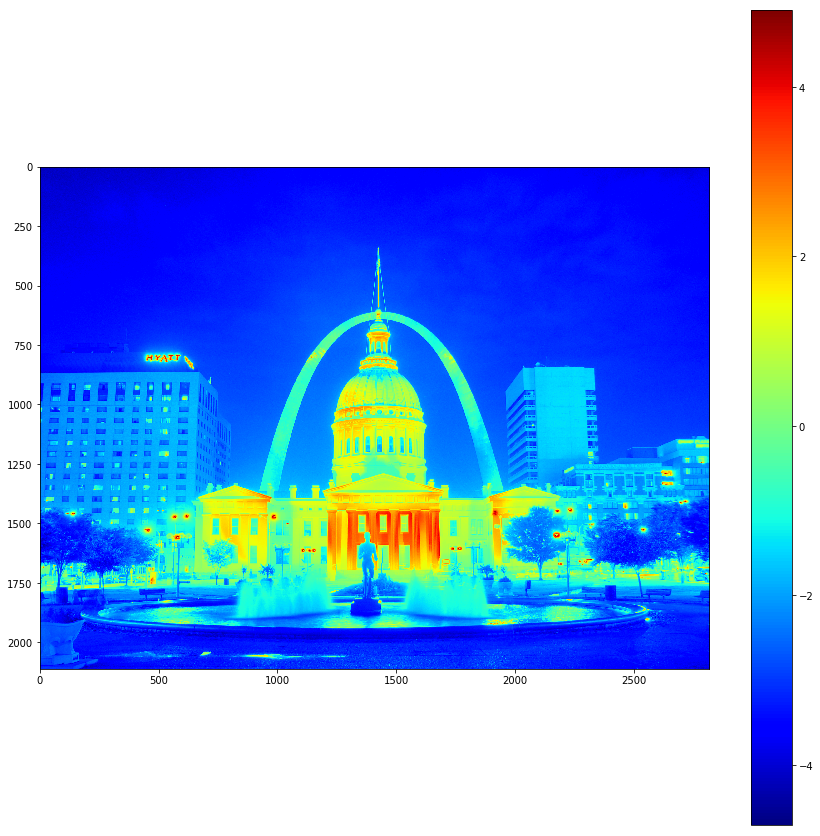

In [24]:
# visulize the radiance map
plt.figure(figsize=(15,15))
plt.imshow(rgb2gray(hdr1_align), cmap='jet')
plt.colorbar()
plt.show()
#matplotlib.image.imsave('hdr1_align_rmap.png', rgb2gray(hdr1_align), cmap='jet')

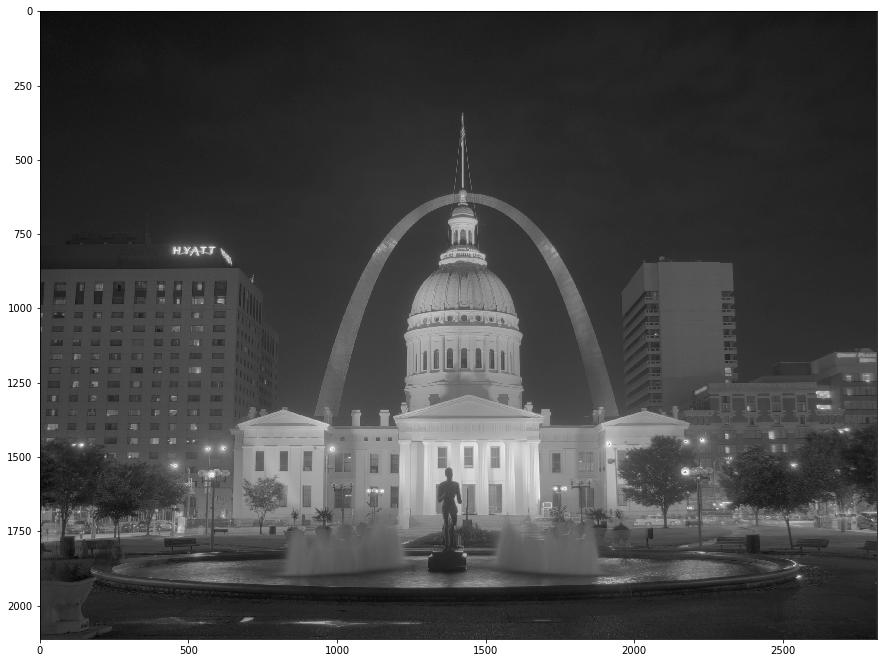

In [25]:
# visulize the hdr image by grayscale tone mapping
plt.figure(figsize=(15,15))
plt.imshow(rgb2gray(hdr1_align), cmap='gray')
plt.show()
#matplotlib.image.imsave('hdr_align_gray.png', rgb2gray(hdr1_align), cmap='gray')

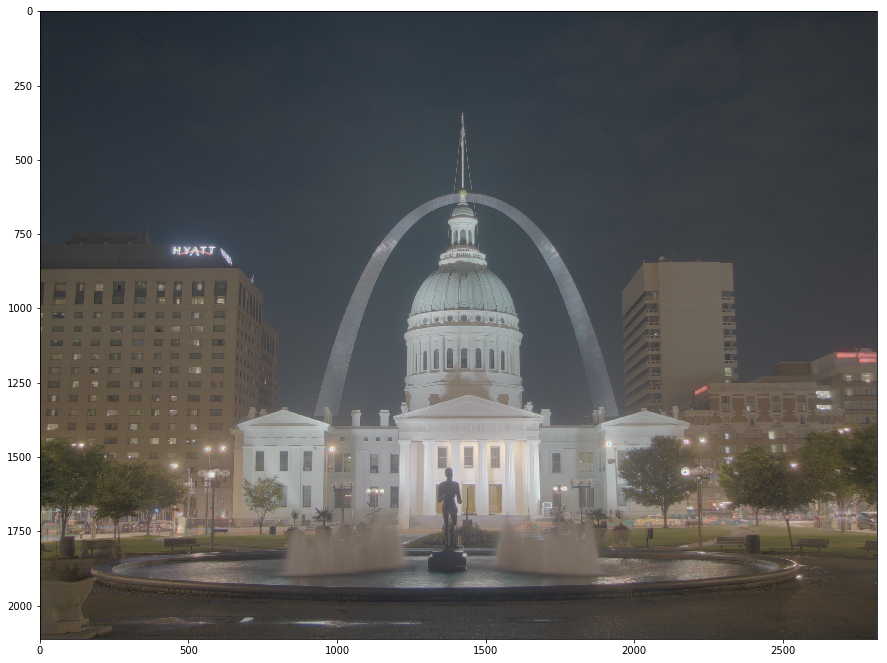

In [26]:
# visulize the hdr image by normalized tone mapping
plt.figure(figsize=(15,15))
hdr1_align_normalized = rescale_intensity(hdr1_align, out_range=(0., 1.))
plt.imshow(hdr1_align_normalized)
plt.show()
#matplotlib.image.imsave('hdr_align_normalize.png', hdr1_align_normalized)

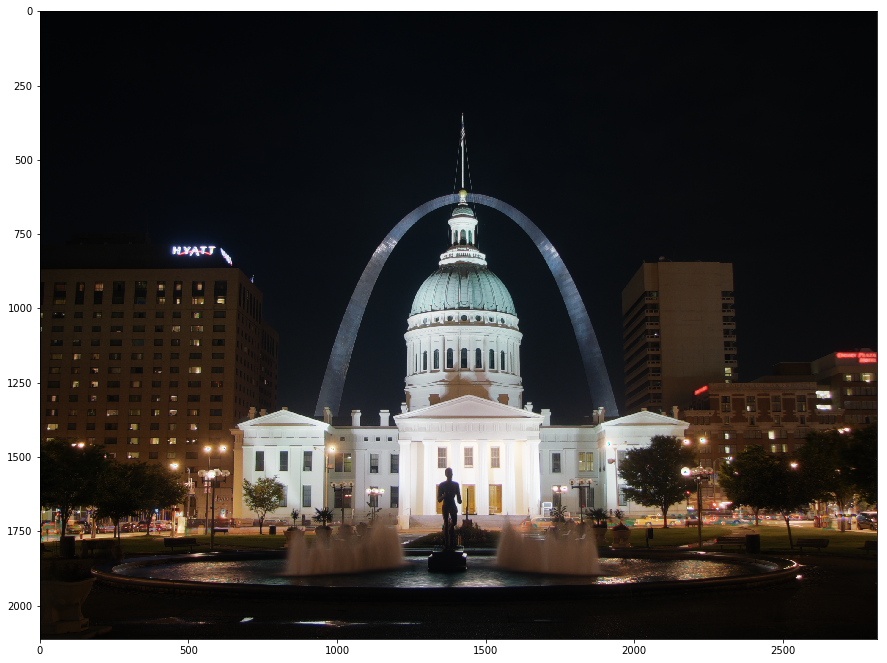

In [27]:
# visulize the hdr image by sigmoid tone mapping
plt.figure(figsize=(15,15))
hdr_align_sigmoid = sigmoid(hdr1_align)
plt.imshow(hdr_align_sigmoid)
plt.show()
#matplotlib.image.imsave('hdr_align_sigmoid.png', hdr_align_sigmoid)

### Test 2: reproduce hdr image in paper

In [28]:
imgs, times = loadv2('test2')

In [29]:
print(imgs.shape)

(16, 768, 512, 3)


In [30]:
# adjust threshold if infinite loop
imgs_align, times = align(imgs, times, threshold=15)

Doing image alignment 1/16.... failed
Doing image alignment 2/16.... 

/Users/Hanzhen/anaconda3/lib/python3.6/site-packages/skimage/transform/_geometric.py:554: RuntimeWarning: divide by zero encountered in true_divide
  dst[:, 0] /= dst[:, 2]
/Users/Hanzhen/anaconda3/lib/python3.6/site-packages/skimage/transform/_geometric.py:555: RuntimeWarning: divide by zero encountered in true_divide
  dst[:, 1] /= dst[:, 2]


failed
Doing image alignment 3/16.... done
Doing image alignment 4/16.... done
Doing image alignment 5/16.... done
Doing image alignment 6/16.... done
Doing image alignment 7/16.... done
Doing image alignment 8/16.... done
Doing image alignment 9/16.... done
Doing image alignment 10/16.... done
Doing image alignment 11/16.... done
Doing image alignment 12/16.... done
Doing image alignment 13/16.... done
Doing image alignment 14/16.... done
Doing image alignment 15/16.... done
Doing image alignment 16/16.... 

/Users/Hanzhen/anaconda3/lib/python3.6/site-packages/skimage/transform/_geometric.py:684: RuntimeWarning: divide by zero encountered in true_divide
  H.flat[list(self._coeffs) + [8]] = - V[-1, :-1] / V[-1, -1]
/Users/Hanzhen/anaconda3/lib/python3.6/site-packages/skimage/transform/_geometric.py:684: RuntimeWarning: invalid value encountered in true_divide
  H.flat[list(self._coeffs) + [8]] = - V[-1, :-1] / V[-1, -1]


failed


In [31]:
print(imgs_align.shape)

(13, 768, 512, 3)


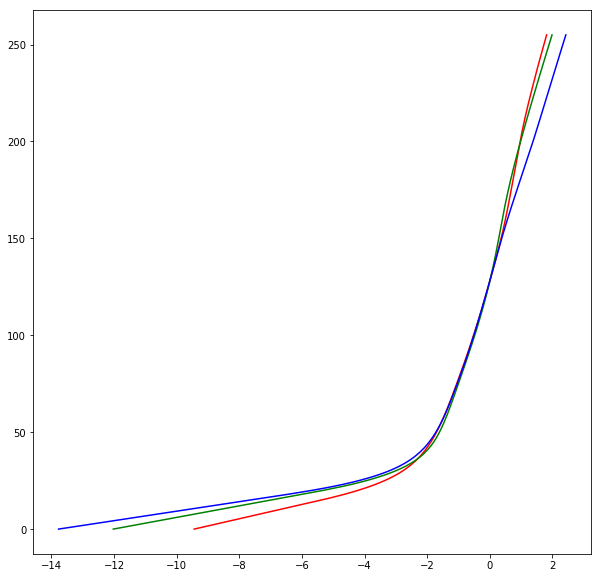

In [32]:
# check the response curve in each channel, you might tune the constant l to get better result
plt.figure(figsize=(10,10))
r = imgs_align[:,:,:,0]
g = imgs_align[:,:,:,1]
b = imgs_align[:,:,:,2]
gr, _ = Debevec_Malik(r, times, 200)
gg, _ = Debevec_Malik(g, times, 200)
gb, _ = Debevec_Malik(b, times, 200)
plt.plot(gr, range(256), 'r')
plt.plot(gg, range(256), 'g')
plt.plot(gb, range(256), 'b')
plt.show()

In [33]:
# compare the respones function using kmean
sample_idx = kmean_sample(imgs, 20)

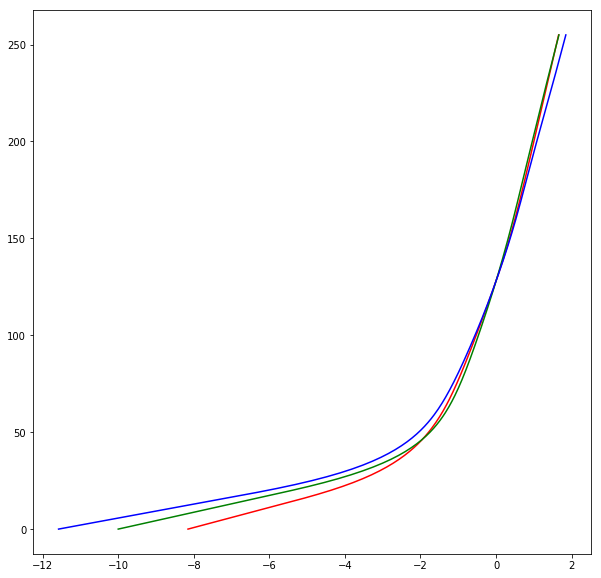

In [34]:
plt.figure(figsize=(10,10))
r = imgs[:,:,:,0]
g = imgs[:,:,:,1]
b = imgs[:,:,:,2]
gr, _ = Debevec_Malik(r, times, 200, sample_idx)
gg, _ = Debevec_Malik(g, times, 200, sample_idx)
gb, _ = Debevec_Malik(b, times, 200, sample_idx)
plt.plot(gr, range(256), 'r')
plt.plot(gg, range(256), 'g')
plt.plot(gb, range(256), 'b')
plt.show()

In [35]:
hdr2 = construct_hdr(imgs, times, 200.)

Constructing radiance map for R channel .... 

/Users/Hanzhen/anaconda3/lib/python3.6/site-packages/skimage/transform/_warps.py:105: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "
/Users/Hanzhen/anaconda3/lib/python3.6/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "
/Users/Hanzhen/anaconda3/lib/python3.6/site-packages/skimage/util/dtype.py:130: UserWarning: Possible precision loss when converting from float64 to uint8
  .format(dtypeobj_in, dtypeobj_out))


done
Constructing radiance map for G channel .... done
Constructing radiance map for B channel .... done


In [36]:
hdr2_kmean = construct_hdr(imgs, times, 200., False, 'kmean')

Constructing radiance map for R channel .... done
Constructing radiance map for G channel .... done
Constructing radiance map for B channel .... done


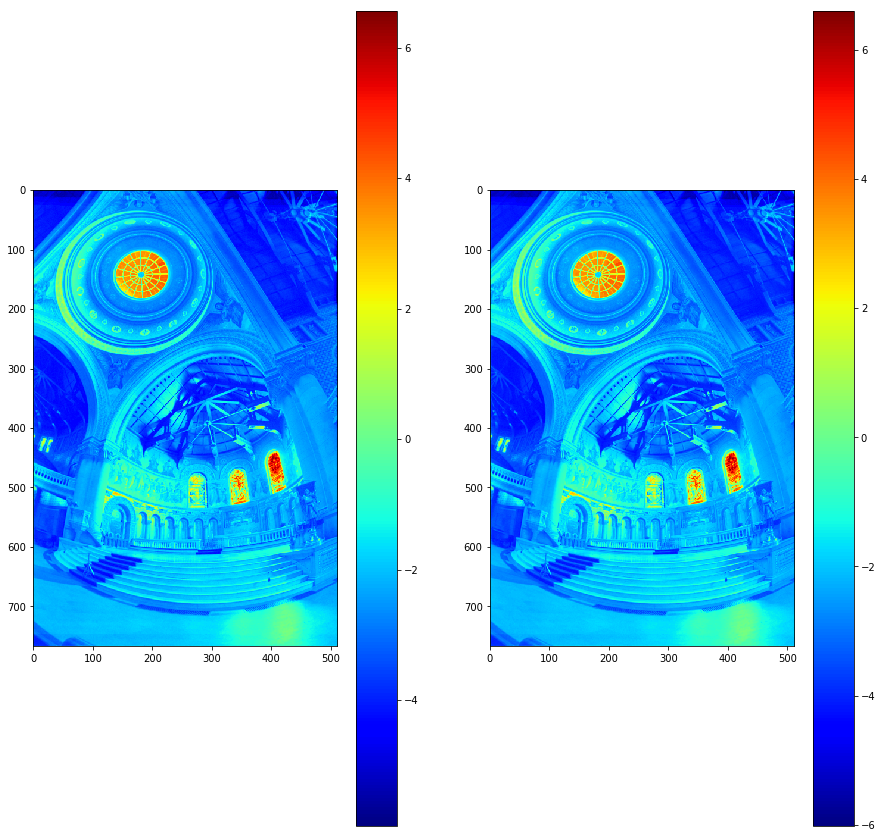

In [37]:
# radiance map
plt.figure(figsize=(15,15))
plt.subplot(121)
plt.imshow(rgb2gray(hdr2), cmap='jet')
plt.colorbar()
plt.subplot(122)
plt.imshow(rgb2gray(hdr2_kmean), cmap='jet')
plt.colorbar()
plt.show()
#matplotlib.image.imsave('hdr2_rmap.png', rgb2gray(hdr2), cmap='jet')

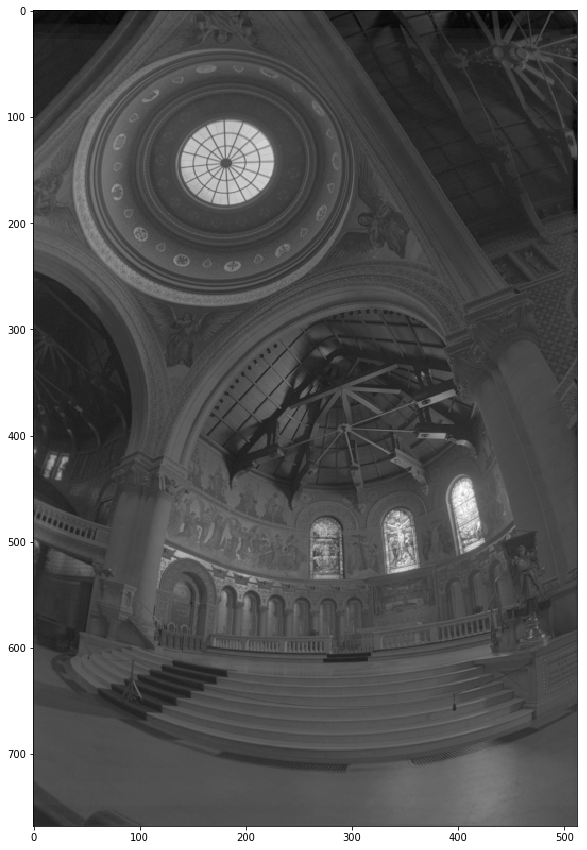

In [38]:
# grayscale tone mapping
plt.figure(figsize=(15,15))
plt.imshow(rgb2gray(hdr2), cmap='gray')
plt.show()
#matplotlib.image.imsave('hdr2_gray.png', rgb2gray(hdr2), cmap='gray')

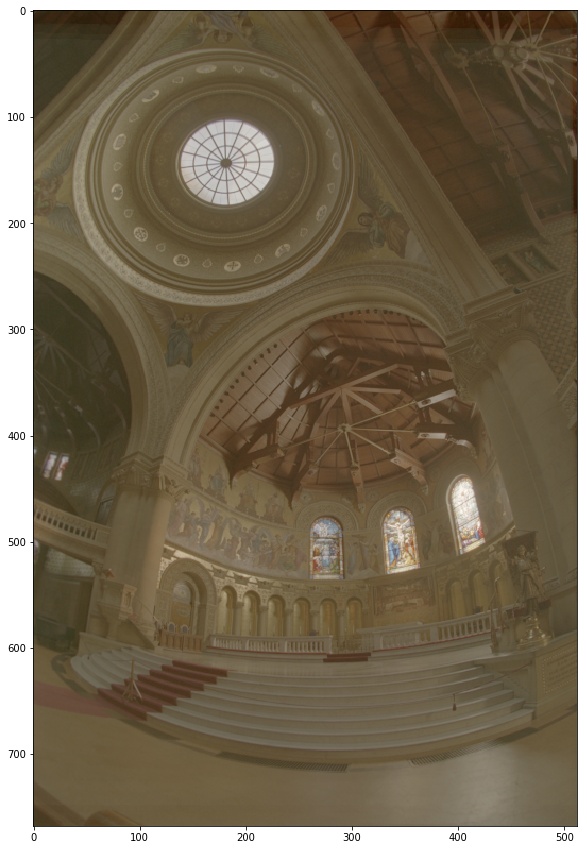

In [39]:
#  normalized/linear tone mapping
plt.figure(figsize=(15,15))
hdr2_normalized = rescale_intensity(hdr2, out_range=(0., 1.))
plt.imshow(hdr2_normalized)
plt.show()
#matplotlib.image.imsave('hdr2_normalize.png', hdr2_normalized)

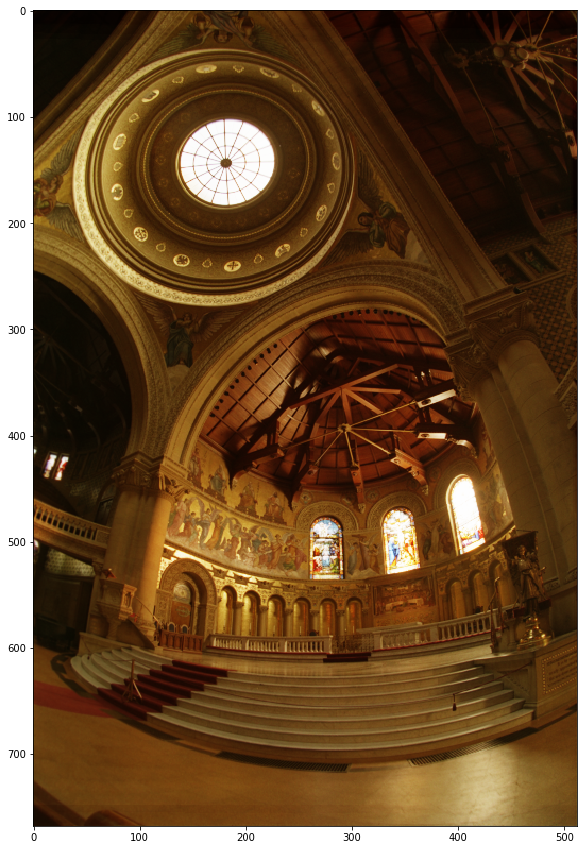

In [40]:
# sigmoid tone mapping with adjustment
plt.figure(figsize=(15,15))
hdr2_sigmoid = sigmoid(hdr2+1)
plt.imshow(hdr2_sigmoid)
plt.show()
#matplotlib.image.imsave('hdr2_sigmoid.png', hdr2_sigmoid)

/Users/Hanzhen/anaconda3/lib/python3.6/site-packages/skimage/util/dtype.py:130: UserWarning: Possible precision loss when converting from float64 to uint16
  .format(dtypeobj_in, dtypeobj_out))


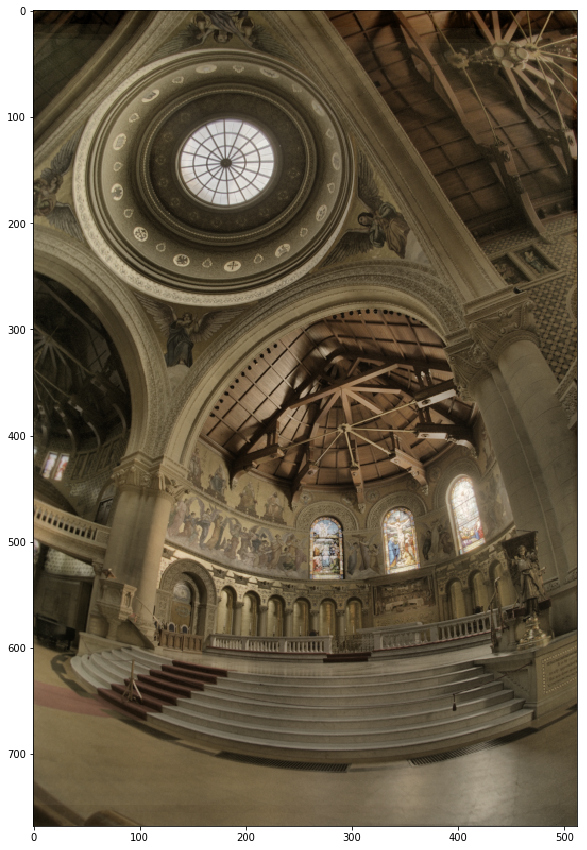

In [41]:
# equalize_adapthist tone mapping
hdr2_normalized = rescale_intensity(hdr2, out_range=(0., 1.))

plt.figure(figsize=(15,15))
hdr2_adapthist = equalize_adapthist(hdr2_normalized)
plt.imshow(hdr2_adapthist)
plt.show()
#matplotlib.image.imsave('hdr2_adapthist.png', hdr2_adapthist)

### Test 3: other test from sample website

In [42]:
imgs, times = loadv2('test3')

In [43]:
print(imgs.shape)

(5, 580, 870, 3)


In [44]:
# adjust threshold if infinite loop
imgs_align, times = align(imgs, times, threshold=15)

Doing image alignment 1/5.... 

/Users/Hanzhen/anaconda3/lib/python3.6/site-packages/skimage/util/dtype.py:130: UserWarning: Possible precision loss when converting from float64 to uint8
  .format(dtypeobj_in, dtypeobj_out))


done
Doing image alignment 2/5.... done
Doing image alignment 3/5.... done
Doing image alignment 4/5.... done
Doing image alignment 5/5.... done


/Users/Hanzhen/anaconda3/lib/python3.6/site-packages/skimage/transform/_warps.py:105: UserWarning: The default mode, 'constant', will be changed to 'reflect' in skimage 0.15.
  warn("The default mode, 'constant', will be changed to 'reflect' in "
/Users/Hanzhen/anaconda3/lib/python3.6/site-packages/skimage/transform/_warps.py:110: UserWarning: Anti-aliasing will be enabled by default in skimage 0.15 to avoid aliasing artifacts when down-sampling images.
  warn("Anti-aliasing will be enabled by default in skimage 0.15 to "


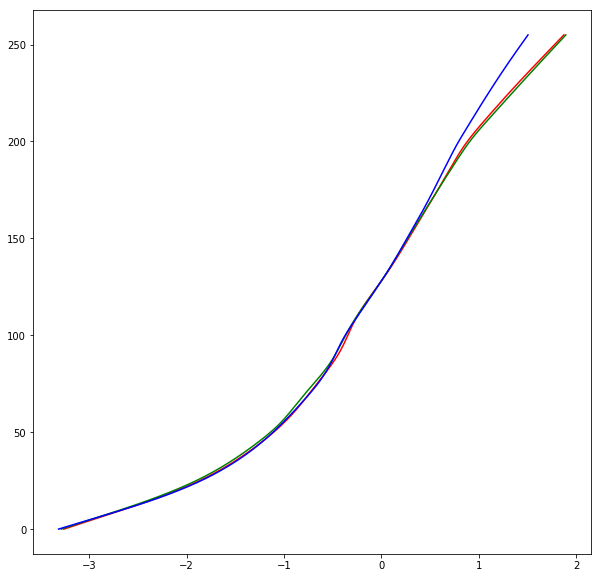

In [45]:
# check the response curve in each channel, you might tune the constant l to get better result
plt.figure(figsize=(10,10))
r = imgs_align[:,:,:,0]
g = imgs_align[:,:,:,1]
b = imgs_align[:,:,:,2]
gr, _ = Debevec_Malik(r, times, 100)
gg, _ = Debevec_Malik(g, times, 100)
gb, _ = Debevec_Malik(b, times, 100)
plt.plot(gr, range(256), 'r')
plt.plot(gg, range(256), 'g')
plt.plot(gb, range(256), 'b')
plt.show()

In [46]:
hdr3 = construct_hdr(imgs_align, times, 100.)

Constructing radiance map for R channel .... done
Constructing radiance map for G channel .... done
Constructing radiance map for B channel .... done


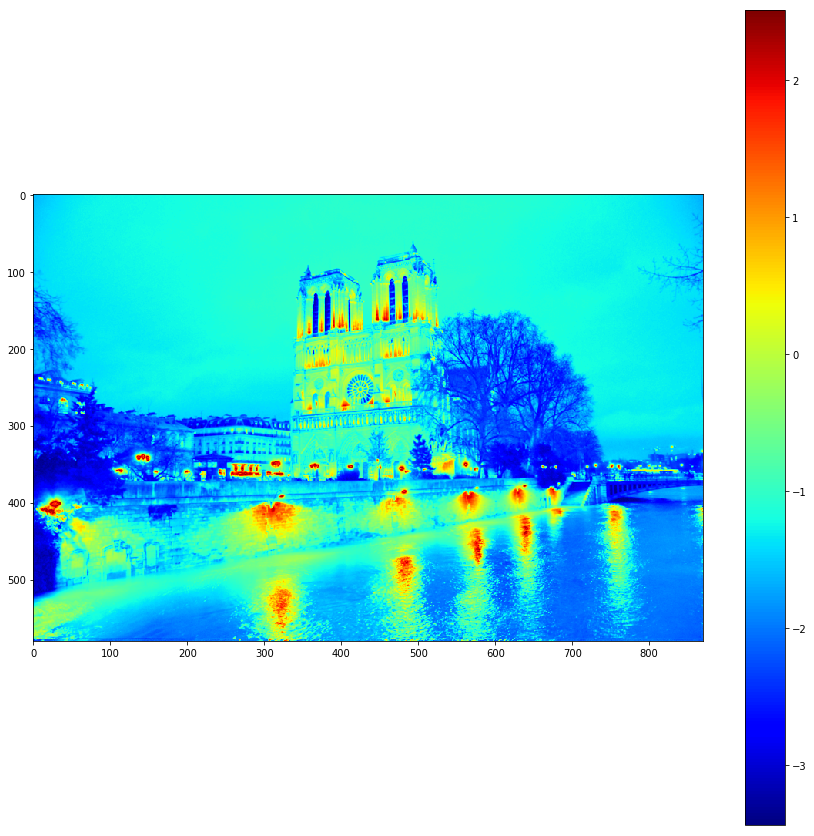

In [47]:
# rmap
plt.figure(figsize=(15,15))
plt.imshow(rgb2gray(hdr3), cmap='jet')
plt.colorbar()
plt.show()
#matplotlib.image.imsave('hdr3_rmap.png', rgb2gray(hdr3), cmap='jet')

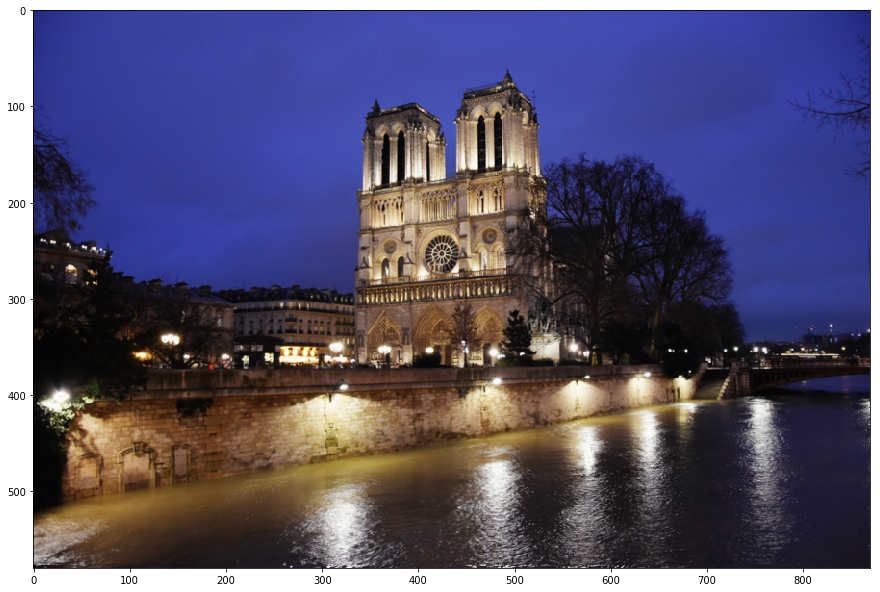

In [48]:
from skimage.exposure import adjust_sigmoid
hdr3_normalized = rescale_intensity(hdr3, out_range=(0., 1.))
plt.figure(figsize=(15,15))
hdr3_sigmoid = adjust_sigmoid(hdr3_normalized)
plt.imshow(hdr3_sigmoid)
plt.show()

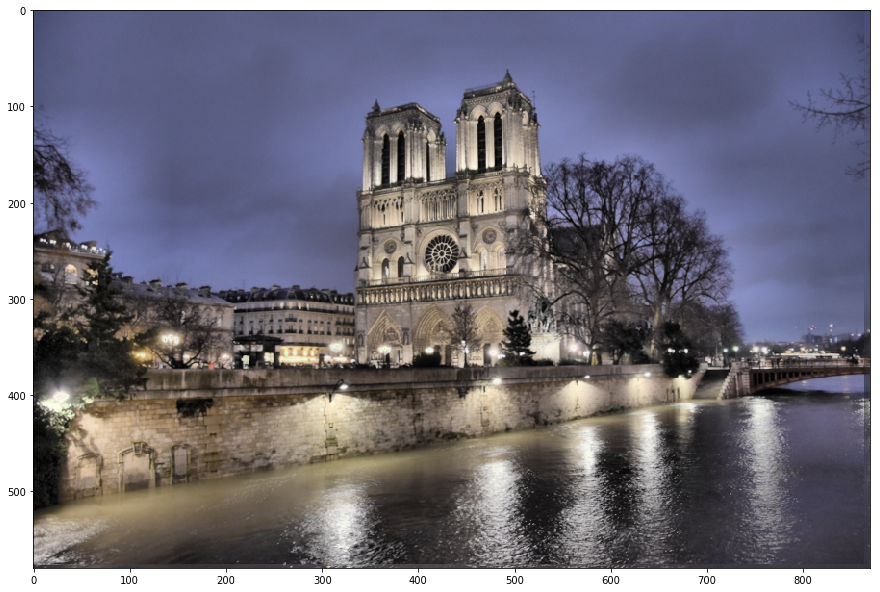

In [49]:
hdr3_normalized = rescale_intensity(hdr3, out_range=(0., 1.))

plt.figure(figsize=(15,15))
hdr3_adapthist = equalize_adapthist(hdr3_normalized)
plt.imshow(hdr3_adapthist)
plt.show()
#matplotlib.image.imsave('hdr3_adapthist.png', hdr3_adapthist)

### Test 4: other test 2 from sample website, using various tone mapping

In [50]:
imgs, times = loadv2('test4')

In [51]:
print(imgs.shape)

(11, 535, 870, 3)


In [52]:
# adjust threshold if infinite loop
imgs_align, times = align(imgs, times, threshold=15)

Doing image alignment 1/11.... done
Doing image alignment 2/11.... 

/Users/Hanzhen/anaconda3/lib/python3.6/site-packages/skimage/transform/_geometric.py:554: RuntimeWarning: divide by zero encountered in true_divide
  dst[:, 0] /= dst[:, 2]
/Users/Hanzhen/anaconda3/lib/python3.6/site-packages/skimage/transform/_geometric.py:555: RuntimeWarning: divide by zero encountered in true_divide
  dst[:, 1] /= dst[:, 2]


done
Doing image alignment 3/11.... done
Doing image alignment 4/11.... done
Doing image alignment 5/11.... done
Doing image alignment 6/11.... done
Doing image alignment 7/11.... done
Doing image alignment 8/11.... done
Doing image alignment 9/11.... done
Doing image alignment 10/11.... done
Doing image alignment 11/11.... done


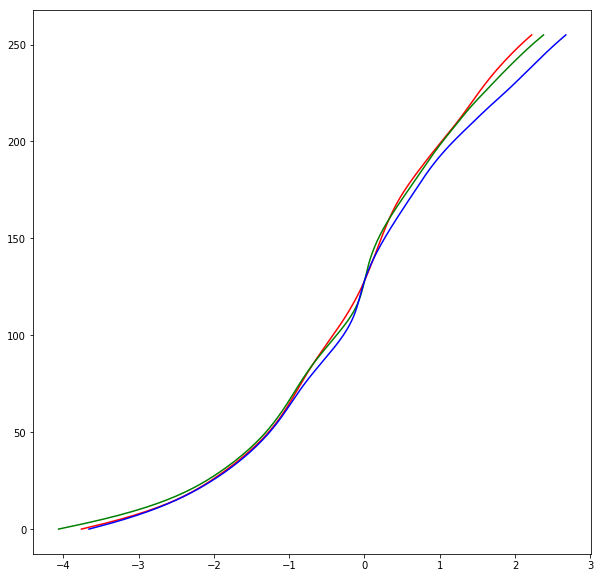

In [53]:
# check the response curve in each channel, you might tune the constant l to get better result
plt.figure(figsize=(10,10))
r = imgs_align[:,:,:,0]
g = imgs_align[:,:,:,1]
b = imgs_align[:,:,:,2]
gr, _ = Debevec_Malik(r, times, 150)
gg, _ = Debevec_Malik(g, times, 150)
gb, _ = Debevec_Malik(b, times, 150)
plt.plot(gr, range(256), 'r')
plt.plot(gg, range(256), 'g')
plt.plot(gb, range(256), 'b')
plt.show()

In [54]:
hdr4 = construct_hdr(imgs, times, 150.)

Constructing radiance map for R channel .... done
Constructing radiance map for G channel .... done
Constructing radiance map for B channel .... done


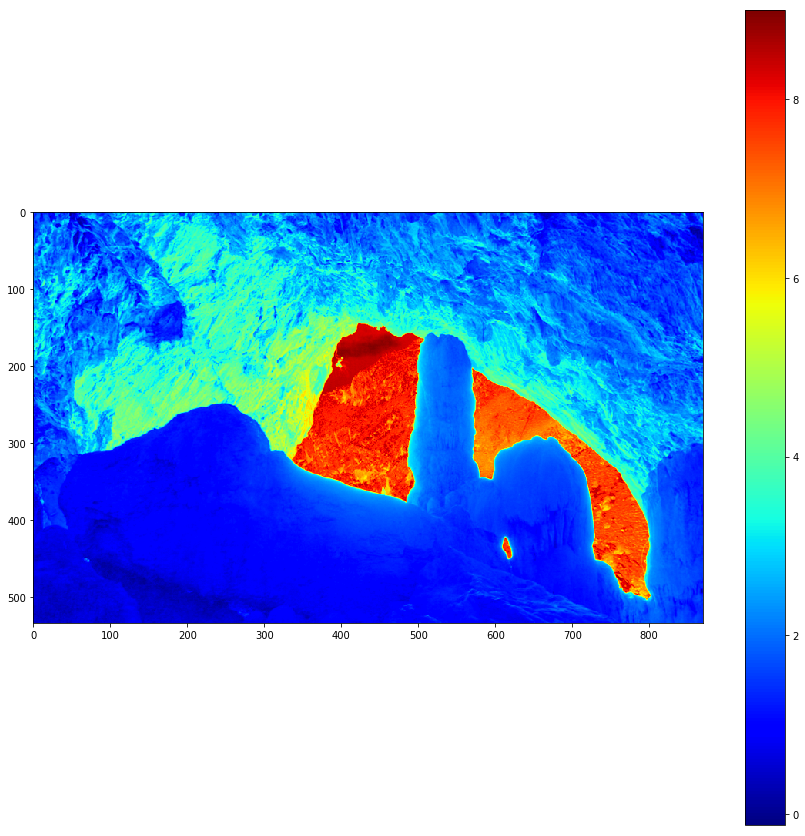

In [55]:
plt.figure(figsize=(15,15))
plt.imshow(rgb2gray(hdr4), cmap='jet')
plt.colorbar()
plt.show()
#matplotlib.image.imsave('hdr4_rmap.png', rgb2gray(hdr4), cmap='jet')

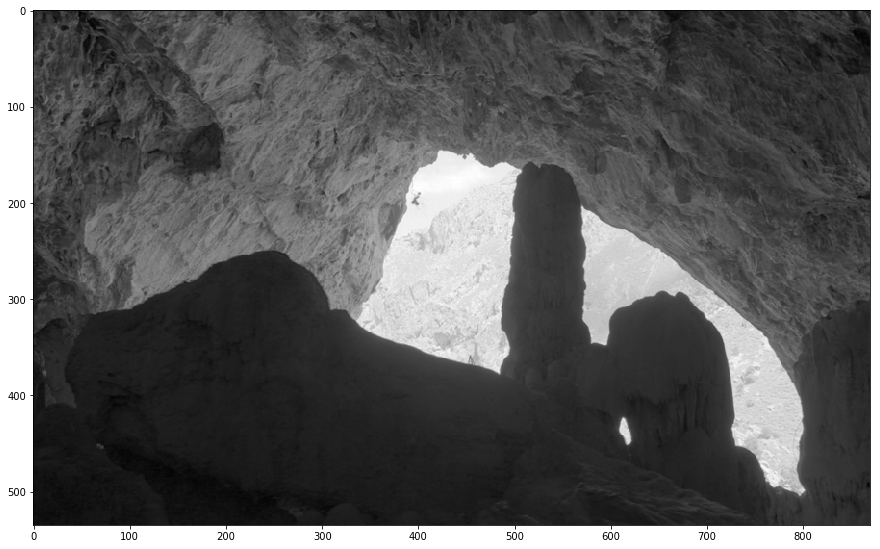

In [56]:
# grayscale
plt.figure(figsize=(15,15))
plt.imshow(rgb2gray(hdr4), cmap='gray')
plt.show()
#matplotlib.image.imsave('hdr4_rgray.png', rgb2gray(g), cmap='gray')

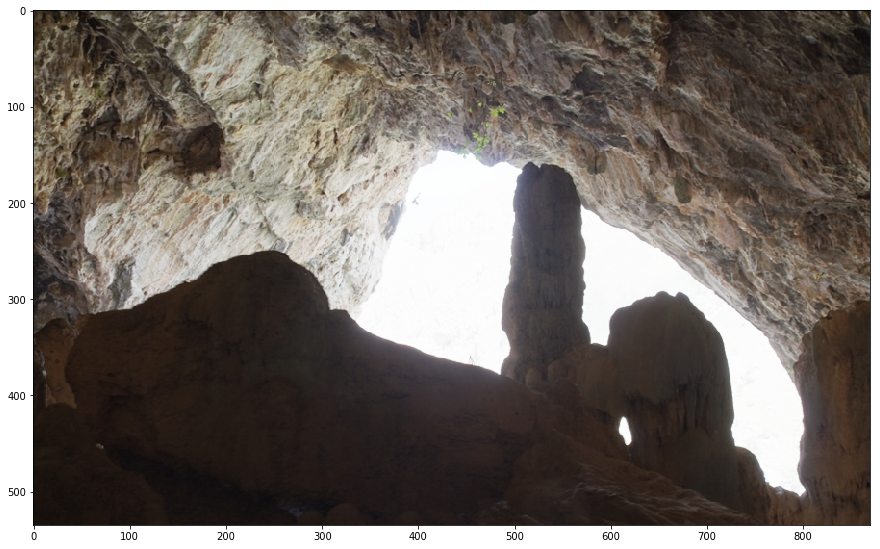

In [57]:
# sigmoid with adj
plt.figure(figsize=(15,15))
hdr4_sigmoid = sigmoid(hdr4-3)
plt.imshow(hdr4_sigmoid)
plt.show()
#matplotlib.image.imsave('hdr4_sigmoid.png', hdr4_sigmoid)

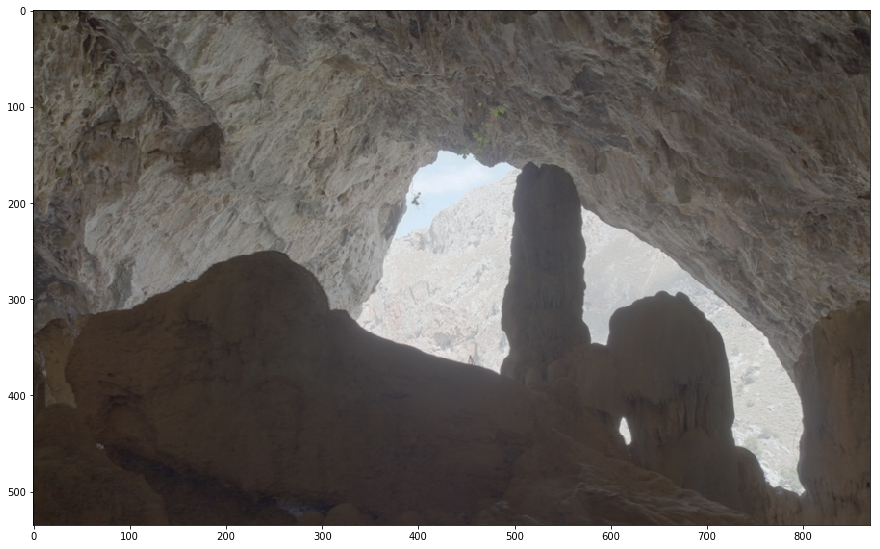

In [58]:
# gamma tone mapping

from skimage.exposure import adjust_gamma
hdr4_normalized = rescale_intensity(hdr4, out_range=(0., 1.))
hdr4_gamma = adjust_gamma(hdr4_normalized, gamma=0.9, gain=1)

plt.figure(figsize=(15,15))
plt.imshow(hdr4_gamma)
plt.show()
#matplotlib.image.imsave('hdr4_gamma.png', hdr4_gamma)

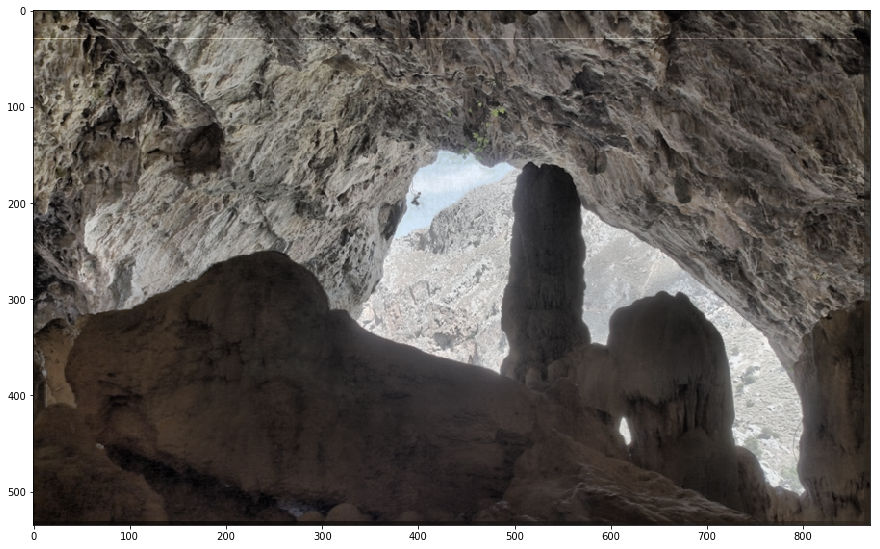

In [59]:
# equalize_adapthist tone mapping
hdr4_normalized = rescale_intensity(hdr4, out_range=(0., 1.))

plt.figure(figsize=(15,15))
hdr4_adapthist = equalize_adapthist(hdr4_normalized)
plt.imshow(hdr4_adapthist)
plt.show()
#matplotlib.image.imsave('hdr4_adapthist.png', hdr4_adapthist)

/Users/Hanzhen/anaconda3/lib/python3.6/site-packages/skimage/exposure/exposure.py:63: UserWarning: This might be a color image. The histogram will be computed on the flattened image. You can instead apply this function to each color channel.
  warn("This might be a color image. The histogram will be "


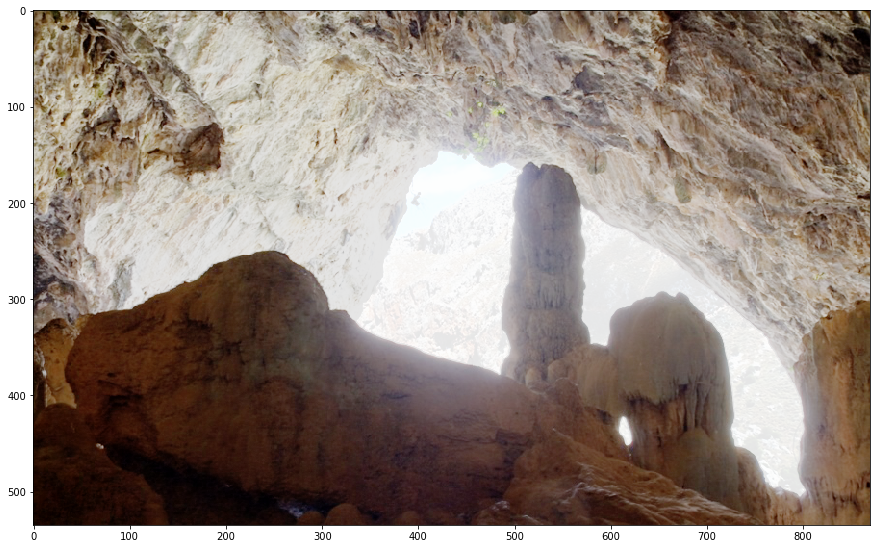

In [60]:
# equalize_hist

from skimage.exposure import equalize_hist
hdr4_normalized = rescale_intensity(hdr4, out_range=(0., 1.))

plt.figure(figsize=(15,15))
hdr4_hist = equalize_hist(hdr4_normalized)
plt.imshow(hdr4_hist)
plt.show()
#matplotlib.image.imsave('hdr4_hist.png', hdr4_hist)

## Acknowledgement

This code is completed by  
Hanzhen Yang, Yue Zhu, Miao He  
for CS484 Project 6 (++): High-dynamic range imaging.

Images from test1 is retrieved from https://www.learnopencv.com/high-dynamic-range-hdr-imaging-using-opencv-cpp-python/  
Images from test2 is retrieved from http://www.pauldebevec.com/Research/HDR/  
Images from test3, 4 are retrieved from https://www.easyhdr.com/examples/  